# Enron email data set exploration

In [38]:
# Get better looking pictures
%config InlineBackend.figure_format = 'retina'

In [39]:
import pandas as pd
import numpy as np
import sys
import os
import scipy.stats as st
import matplotlib.pyplot as plt
import datetime
from dateutil import parser
import networkx as nx

In [40]:
df = pd.read_feather('enron.feather')
df = df.sort_values(['Date'])
df.tail(5)

,MailID,Date,From,To,Recipients,Subject,filename
601933,72015,2002-07-12,denise.williams,ge_benefits,1,URGENT!!! CUTOVER WEEKEND,fischer-m/all_documents/428.
601861,71978,2002-07-12,mark.fisher,tom.nemila,1,WR613 Pitch System performance,fischer-m/all_documents/425.
601579,71905,2002-07-12,mark.fisher,tom.nemila,1,WR613 Pitch System performance,fischer-m/_sent_mail/1.
605086,73118,2002-07-12,denise.williams,ge_benefits,1,URGENT!!! CUTOVER WEEKEND,fischer-m/notes_inbox/2.
601581,71907,2002-07-12,mark.fisher,tom.nemila,1,WR627 Fault Paretos (May 2002),fischer-m/_sent_mail/2.


## Email traffic over time

Group the data set by `Date` and `MailID`, which will get you an index that collects all of the unique mail IDs per date. Then reset the index so that those  date and mail identifiers become columns and then select for just those columns; we don't actually care about the counts created by the `groupby` (that was just to get the index).  Create a histogram that shows the amount of traffic per day. Then specifically for email sent from `richard.shapiro` and then `john.lavorato`.  Because some dates are set improperly (to 1980), filter for dates greater than January 1, 1999.

In [41]:
stored_df=df.groupby(["Date","MailID"])['Recipients'].nunique().reset_index(drop=False)
del stored_df["Recipients"]
stored_df_richard=df[df["From"]=="richard.shapiro"].groupby(["Date","MailID"])['Recipients'].nunique().reset_index(drop=False)
stored_df_johnl=df[df["From"]=="john.lavorato"].groupby(["Date","MailID"])['Recipients'].nunique().reset_index(drop=False)
del stored_df_richard["Recipients"]
del stored_df_johnl["Recipients"]

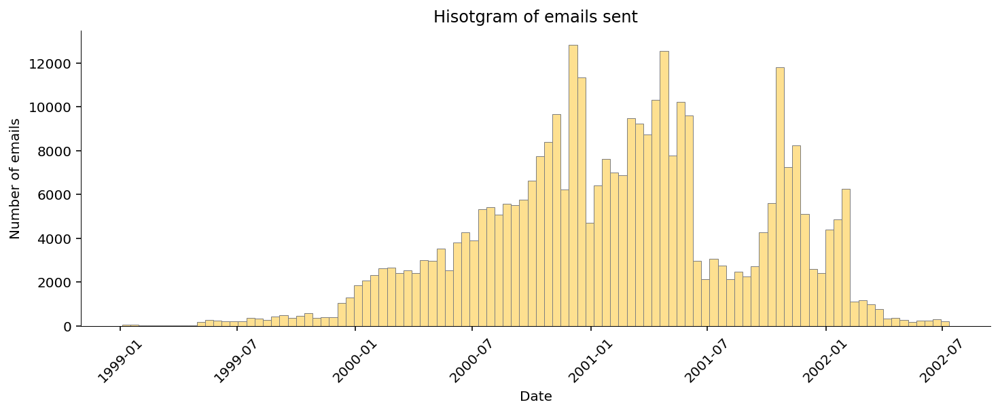

In [42]:
fig, ax = plt.subplots(figsize=(12,4))
ax.hist(stored_df[stored_df["Date"]>"1999-01-01"]["Date"],bins=100,color="#fee090")
ax.set_xlabel("Date")
ax.set_ylabel("Number of emails")
ax.set_title("Hisotgram of emails sent")

ax.tick_params(axis='x', rotation=45)

for rect in ax.patches:
    rect.set_linewidth(.5)
    rect.set_edgecolor('grey')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_linewidth(0.5)
ax.spines['bottom'].set_linewidth(0.5)

plt.show()

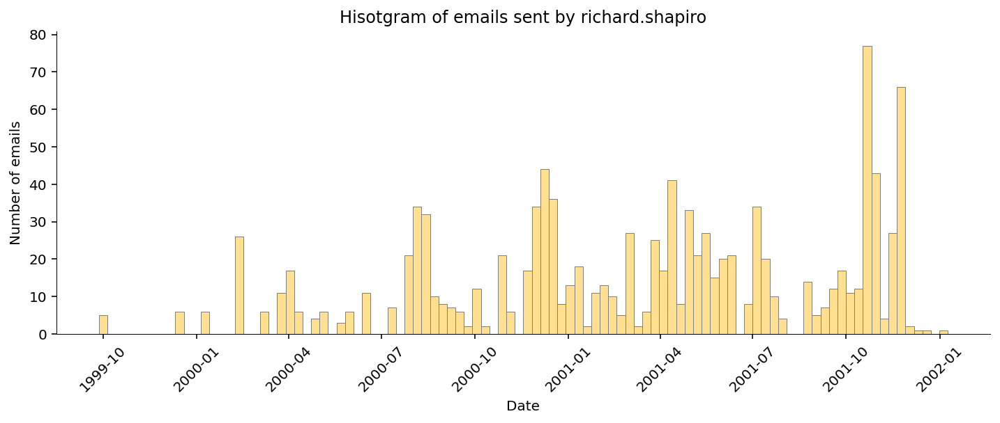

In [43]:
fig, ax = plt.subplots(figsize=(12,4))
ax.hist(stored_df_richard[stored_df_richard["Date"]>"1999-01-01"]["Date"],bins=100,color="#fee090")
ax.set_xlabel("Date")
ax.set_ylabel("Number of emails")
ax.set_title("Hisotgram of emails sent by richard.shapiro")

ax.tick_params(axis='x', rotation=45)

for rect in ax.patches:
    rect.set_linewidth(.5)
    rect.set_edgecolor('grey')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_linewidth(0.5)
ax.spines['bottom'].set_linewidth(0.5)

plt.show()

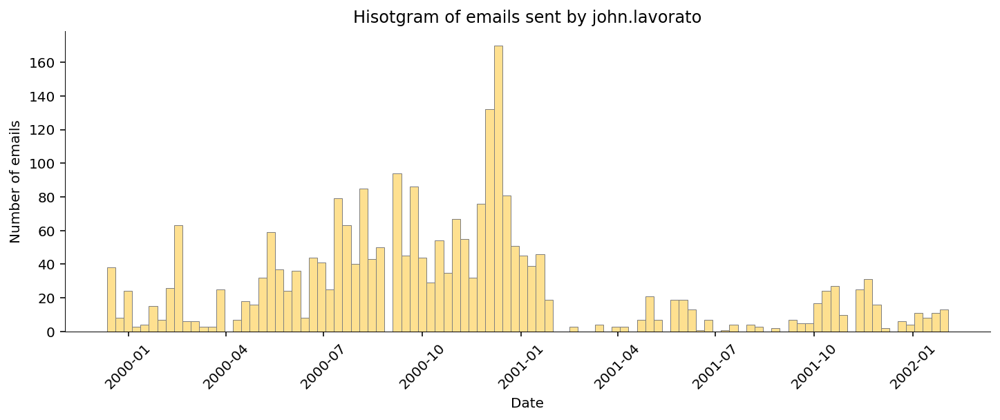

In [44]:
fig, ax = plt.subplots(figsize=(12,4))
ax.hist(stored_df_johnl[stored_df_johnl["Date"]>"1999-01-01"]["Date"],bins=100,color="#fee090")
ax.set_xlabel("Date")
ax.set_ylabel("Number of emails")
ax.set_title("Hisotgram of emails sent by john.lavorato")

ax.tick_params(axis='x', rotation=45)

for rect in ax.patches:
    rect.set_linewidth(.5)
    rect.set_edgecolor('grey')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_linewidth(0.5)
ax.spines['bottom'].set_linewidth(0.5)

plt.show()

## Received emails

Count the number of messages received  per user and then sort in reverse order. Make a bar chart showing the top 30 email recipients.

In [45]:
cnt_messages_df=df.groupby(["To"])['MailID'].count().sort_values(ascending=False).reset_index(drop=False)

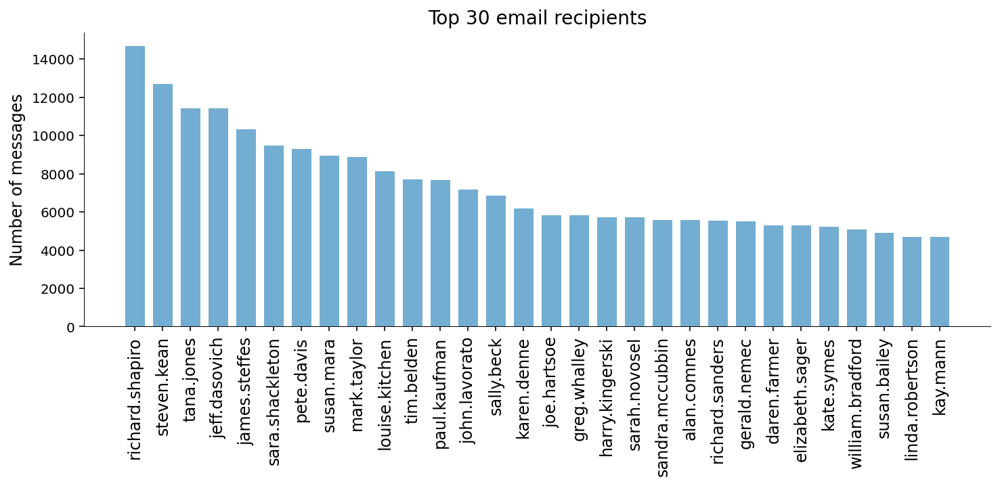

In [46]:
fig, ax = plt.subplots(figsize=(12,4)) 
ax.bar(cnt_messages_df["To"][0:30], cnt_messages_df["MailID"][0:30], color='#73add2', width=0.7)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_linewidth(.5)
ax.spines['bottom'].set_linewidth(.5)

ax.set_ylabel("Number of messages",size=12)
ax.set_title("Top 30 email recipients",size=14)


ax.set_xticks(ax.get_xticks())
ax.set_xticklabels([f'{n}' for n in cnt_messages_df["To"][0:30]],fontsize=12,rotation=90)
 
plt.show()

cnt_int_df=df_imported.groupby(["From",'MailID'])['Recipients'].nunique().reset_index(drop=False)
cnt_from_msg_df=cnt_int_df.groupby(["From"])['MailID'].count().sort_values(ascending=False).reset_index(drop=False)

## Sent emails

Make a bar chart indicating the top 30 mail senders. This is more complicated than the received emails because a single person can email multiple people in a single email. So,  group by `From` and `MailID`, convert the index back to columns and then group again by `From` and get the count.

In [47]:
cnt_int_df=df.groupby(["From",'MailID'])['Recipients'].nunique().reset_index(drop=False)
cnt_from_msg_df=cnt_int_df.groupby(["From"])['MailID'].count().sort_values(ascending=False).reset_index(drop=False)

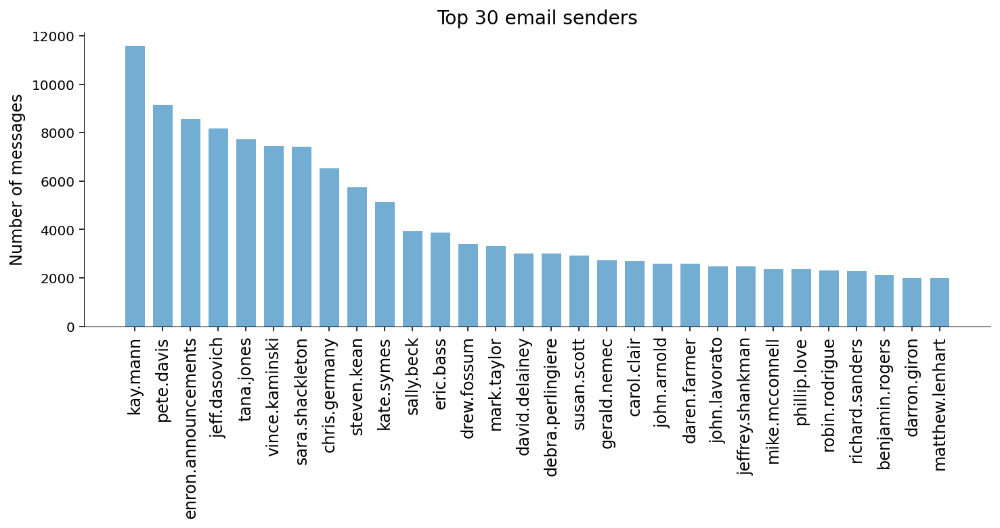

In [48]:
fig, ax = plt.subplots(figsize=(12,4)) 
ax.bar(cnt_from_msg_df["From"][0:30], cnt_from_msg_df["MailID"][0:30], color='#73add2', width=0.7)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_linewidth(.5)
ax.spines['bottom'].set_linewidth(.5)

ax.set_ylabel("Number of messages",size=12)
ax.set_title("Top 30 email senders",size=14)


ax.set_xticks(ax.get_xticks())
ax.set_xticklabels([f'{n}' for n in cnt_from_msg_df["From"][0:30]],fontsize=12,rotation=90)
 
plt.show()

## Email heatmap

Given a list of Enron employees, compute a heat map that indicates how much email traffic went between each pair of employees. The heat map is not symmetric because Susan sending mail to Xue is not the same thing as Xue sending mail to Susan. The first step is to group the data frame by `From` and `To` columns in order to get the number of emails from person $i$ to person $j$. Then, create a 2D numpy matrix, $C$, of integers and set $C_{i,j}$ to the count of person $i$ to person $j$. Using matplotlib, `ax.imshow(C, cmap='GnBu', vmax=4000)`, show the heat map and add tick labels at 45 degrees for the X axis. Set the labels to the appropriate names.   Draw the number of emails in the appropriate cells of the heat map, for all values greater than zero. Please note that when you draw text using `ax.text()`, the coordinates are X,Y whereas the coordinates in the $C$ matrix are row,column so you will have to flip the coordinates.

In [49]:
people = ['jeff.skilling', 'kenneth.lay', 'louise.kitchen', 'tana.jones',
          'sara.shackleton', 'vince.kaminski', 'sally.beck', 'john.lavorato',
          'mark.taylor', 'greg.whalley', 'jeff.dasovich', 'steven.kean',
          'chris.germany', 'mike.mcconnell', 'benjamin.rogers', 'j.kaminski',
          'stanley.horton', 'a..shankman', 'richard.shapiro']

In [50]:
cnt_to_frm_df=df.groupby(["To",'From'])['MailID'].count().reset_index(drop=False)
cnt_to_frm_req_df=cnt_to_frm_df[cnt_to_frm_df['To'].isin(people) & cnt_to_frm_df['From'].isin(people)]
elem_df=cnt_to_frm_req_df.pivot(index='From', columns='To', values='MailID')
elem_df=elem_df[people]
elem_df=elem_df.reindex(people).fillna(0)

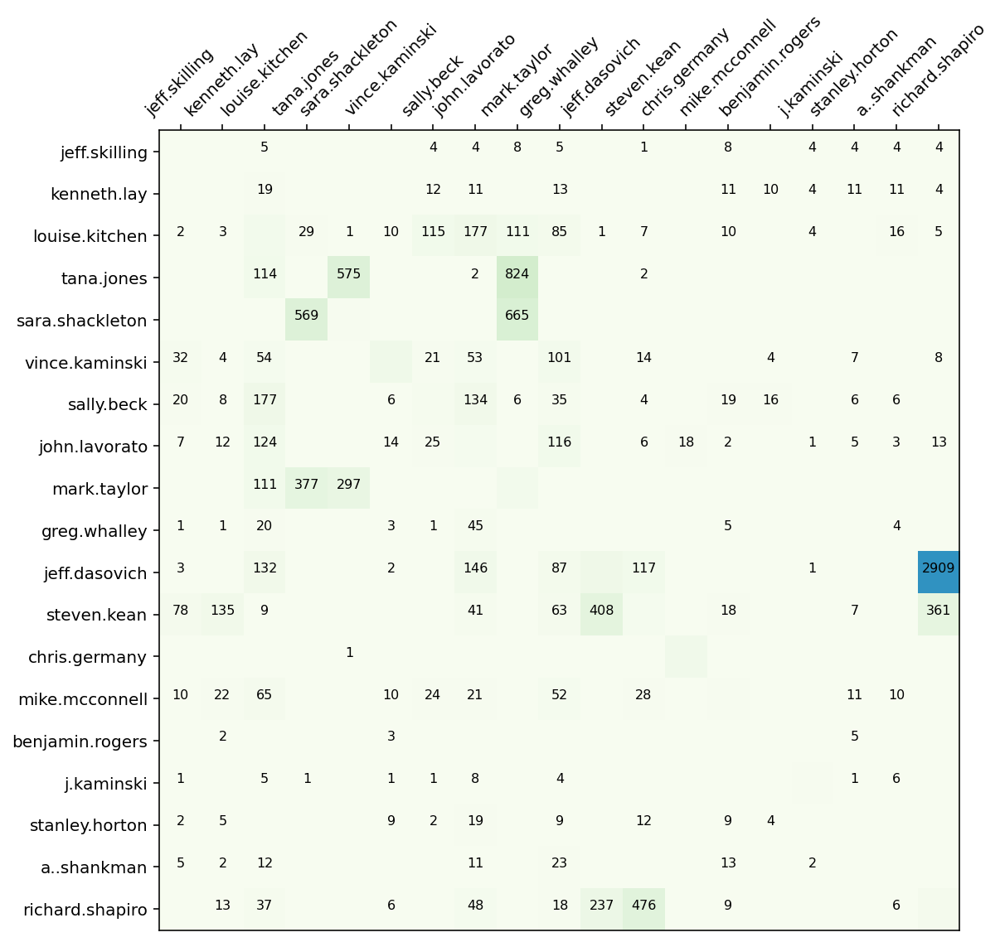

In [51]:
C=elem_df.to_numpy()
fig, ax = plt.subplots(figsize=(200, 8))

im = ax.imshow(C, cmap='GnBu', vmax=4000)

        
ax.set_xticks(range(0,19))
ax.set_xticklabels(people)
ax.set_xticklabels([f'{n}' for n in people],fontsize=10,rotation=45)

ax.set_yticks(range(0,19))
ax.set_yticklabels(people) 

for i in range(19):
    for j in range(19):
        if i!=j:
            if C[j,i]!=0:
                ax.text(i, j, f"{C[j,i]:.0f}", horizontalalignment='center',size=8)

ax.xaxis.tick_top()

#fig.colorbar(im, ax=ax, shrink=.83) 
plt.tight_layout()
plt.show()

## Build graph and compute rankings

From the data frame, create a graph data structure using networkx. Create an edge from node A to node B if there is an email from A to B in the data frame. Although we do know the total number of emails between people, let's keep it simple and use simply a weight of 1 as the edge label. See networkx method `add_edge()`.

1. Using networkx, compute the pagerank between all nodes. Get the data into a data frame, sort in reverse order, and display the top 15 users from the data frame. 
2. Compute the centrality for the nodes of the graph. The documentation says that centrality is "*the fraction of nodes it is connected to.*"

I use `DataFrame.from_dict` to convert the dictionaries returned from the various networkx methods to data frames.

In [52]:
G = nx.DiGraph()

In [53]:
for i,j in zip(cnt_to_frm_df['From'],cnt_to_frm_df['To']):
    G.add_edge(i,j,weight=1)

pr = nx.pagerank(G)
pr_df=pd.DataFrame.from_dict(pr,orient='index')
pr_df.columns=["PageRank"]

### Node PageRank

In [54]:
pr_df.sort_values(by="PageRank",ascending=False).head(15)

,PageRank
jeff.skilling,0.004966
kenneth.lay,0.004579
louise.kitchen,0.004494
tana.jones,0.004299
sara.shackleton,0.004022
vince.kaminski,0.003850
sally.beck,0.003577
john.lavorato,0.003467
gerald.nemec,0.002643
rod.hayslett,0.002540


### Centrality

In [55]:
central=nx.algorithms.centrality.degree_centrality(G)
central_df=pd.DataFrame.from_dict(central,orient='index')
central_df.columns=["PageRank"]

central_df.sort_values(by="PageRank",ascending=False).head(15)

,PageRank
sally.beck,0.088048
outlook.team,0.082401
david.forster,0.079988
kenneth.lay,0.076137
technology.enron,0.063662
jeff.skilling,0.058220
tana.jones,0.054677
louise.kitchen,0.053445
jeff.dasovich,0.048773
sara.shackleton,0.047952


### Plotting graph subsets

The email graph is way too large to display the whole thing and get any meaningful information out. However, we can look at subsets of the graph such as the neighbors of a specific node. To visualize it we can use different strategies to layout the nodes. In this case, we will use two different layout strategies: *spring* and *kamada-kawai*. According to
[Wikipedia](https://en.wikipedia.org/wiki/Force-directed_graph_drawing), these force directed layout strategies have the characteristic: "*...the edges tend to have uniform length (because of the spring forces), and nodes that are not connected by an edge tend to be drawn further apart...*".  

Use networkx `ego_graph()` method to get a radius=1 neighborhood around `jeff.skilling` and draw the spring graph with a plot that is 20x20 inch so we can see details.  Then, draw the same subgraph again using the kamada-kawai layout strategy. Finally, get the neighborhood around kenneth.lay and draw kamada-kawai.

In [64]:
eg=nx.ego_graph(G, "jeff.skilling", radius=1, center=True, undirected=False, distance=None)
eg_kl=nx.ego_graph(G, "kenneth.lay", radius=1, center=True, undirected=False, distance=None)

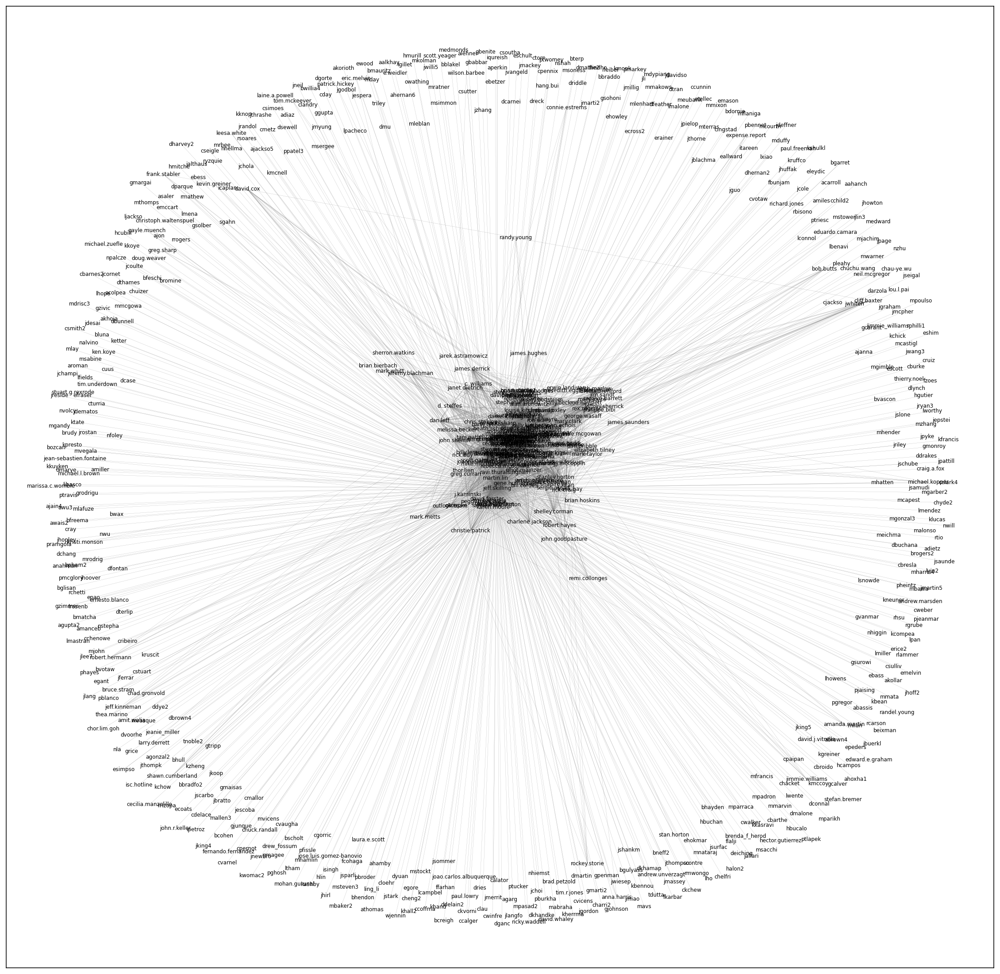

In [65]:
plt.figure(figsize=(20,20))
pos = nx.spring_layout(eg,seed=np.random.RandomState(501))
nx.draw_networkx(eg, pos, node_size=0,
with_labels=True,
edge_color='#787878',
width=.1, arrows=False,
font_size=6)
plt.show()

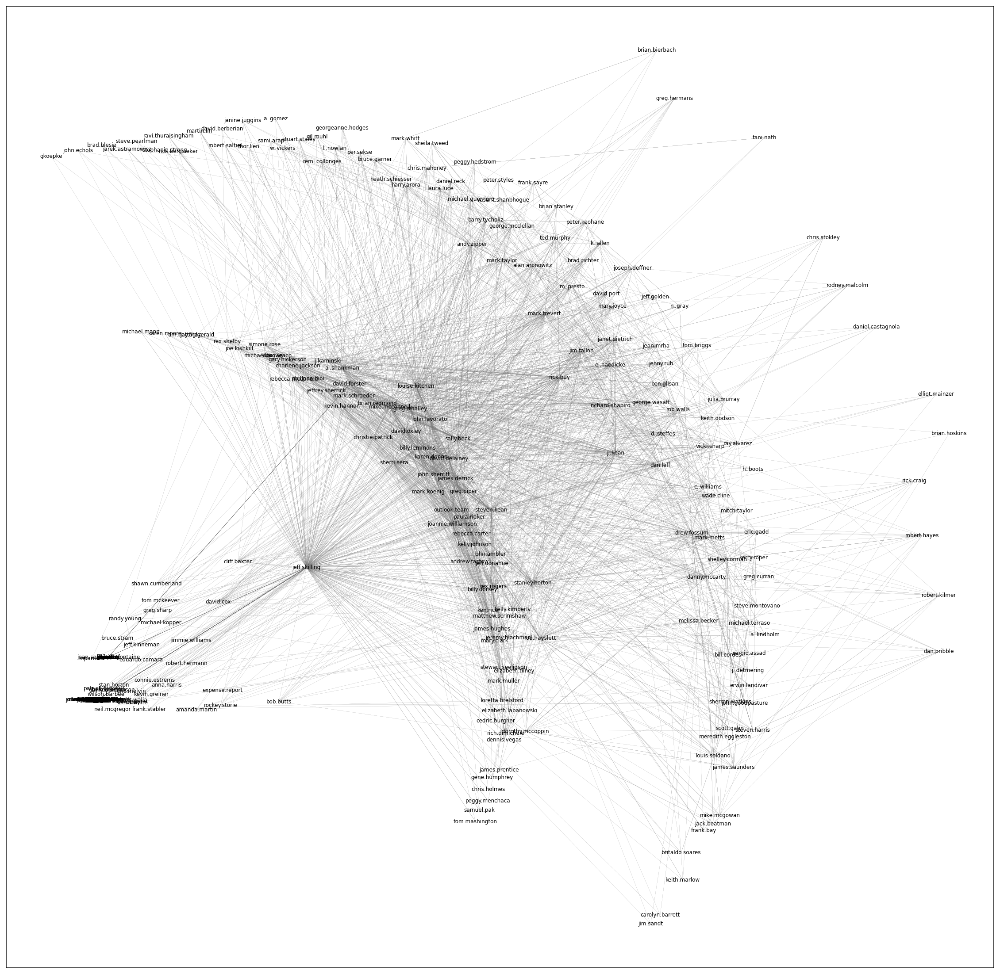

In [66]:
plt.figure(figsize=(20,20))
pos = nx.kamada_kawai_layout(eg)
nx.draw_networkx(eg, pos, node_size=0,
with_labels=True,
edge_color='#787878',
width=.1, arrows=False,
font_size=6)
plt.show()

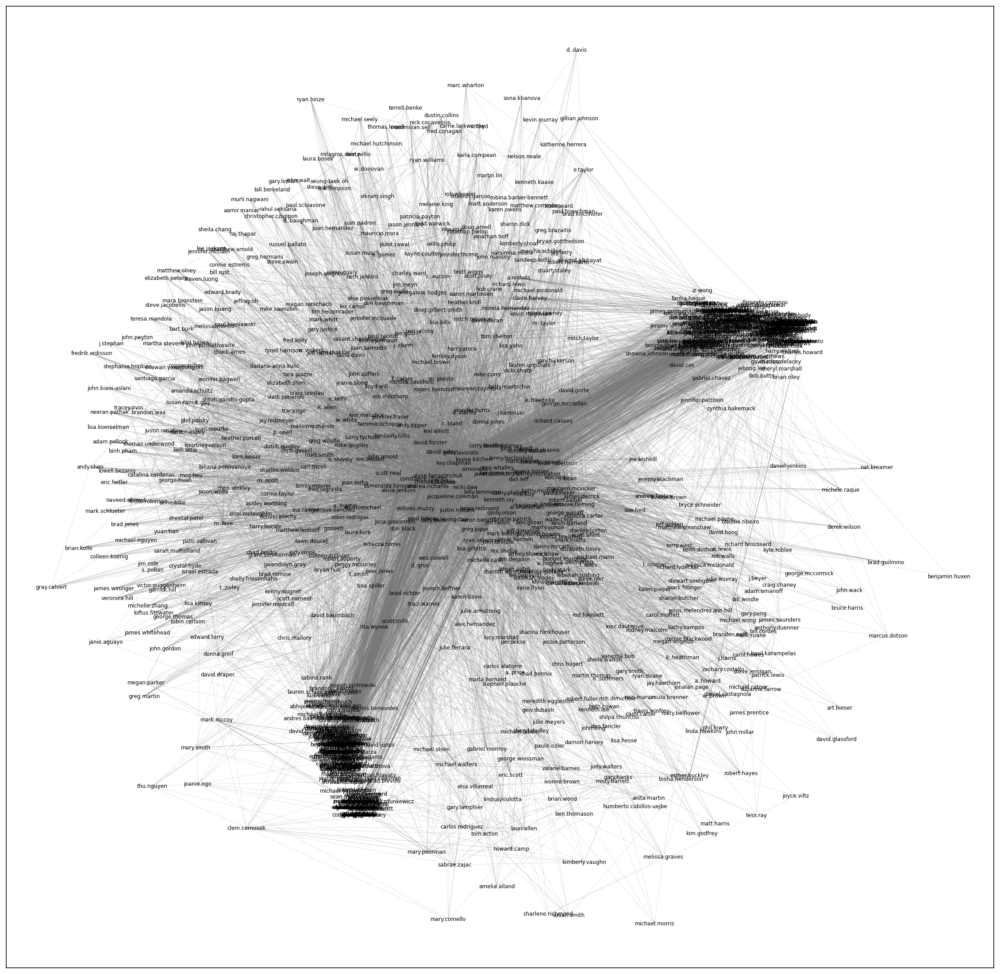

In [67]:
plt.figure(figsize=(20,20))
pos = nx.kamada_kawai_layout(eg_kl)
nx.draw_networkx(eg_kl, pos, node_size=0,
with_labels=True,
edge_color='#787878',
width=.1, arrows=False,
font_size=6)
plt.show()